# Notebook for first EDA Project "House Prices in King County"

In [1]:
%reset -fs

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns

# for variable transformation
import scipy.stats as stats

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

%matplotlib inline


# First Look into the Data

## Variable Overview

| Variable | Definition                                 | Key                                            | Type        |
|:----------|:--------------------------------------------|:------------------------------------------------|-------------|
| id | unique identified for a house                    |                                           | ordnial     |
| date       | house was sold                           |                                                | datetime     |
| price     |      house price - to predict             |                                                | intervaal |
| bedrooms  | number of Bedrooms/House                  |                                                | ratio       |
| bathrooms | number of bathrooms/bedrooms              |                                                | ratio       |
| sqft_living   |       footage of the home             |                                                | ratio         |
| sqft_lot   |     footage of the lot                   |                                                | ratio     |
| floors    |   total floors (levels) in house          |                                                | ratio       |
|waterfront | object with waterfront view  |                                                | nominal     |
| view      |   object has been viewed                   |                                                |nominal |
|condition  |  how good the condition is ( Overall )    |                                                | ordinal  
| grade     |  overall grade given to the housing unit, based on King County grading system  |                                                | ordinal  
| sqft_above  | square footage of house apart from basement   |                                                | ratio  
| sqft_basement  | square footage of the basement        |                                                | ratio  
| yr_built  |    year the object was built                            |                                                | interval 
| yr_renovated  |  year when the object was renovated         |                                                | interval 
| zipcode  |      zip code                              |                                                | ordinal 
| lat      |    latitude coordinate                     |                                                | ratio 
| long     |    longitude coordinate                    |                                                | ratio 
| sqft_living15  |  square footage of interior housing living space for the nearest 15 neighbors   |                         | ratio 
| sqft_lot15  | square footage of the land lots of the nearest 15 neighbors |                                                | ratio 

## Import the data into a pandas dataframe

In [3]:
hp = pd.read_csv('King_County_House_prices_dataset.csv')
hp

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819
7,2008000270,1/15/2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,...,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,...,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,...,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570


## Get a basic overview over the data

In [4]:
print("Number of rows and coloumns in the House Pricing data set: ", hp.shape)

Number of rows and coloumns in the House Pricing data set:  (21597, 21)


In [5]:
hp.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [6]:
hp.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287
21596,1523300157,10/15/2014,325000.0,2,0.75,1020,1076,2.0,0.0,0.0,...,7,1020,0.0,2008,0.0,98144,47.5941,-122.299,1020,1357


In [7]:
hp.sample(10) #get a random sample from inbetween

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17310,9809000010,1/6/2015,1630000.0,5,2.50,3090,16583,2.0,0.0,0.0,...,9,3090,0.0,1964,NaN,98004,47.6458,-122.218,3740,17853
11358,6071300550,8/22/2014,600000.0,4,2.50,2370,9135,1.0,0.0,0.0,...,8,1600,770.0,1967,NaN,98006,47.5564,-122.177,2050,9468
7044,4222200280,10/21/2014,225000.0,3,2.00,1460,7740,1.0,NaN,0.0,...,7,1460,0.0,1968,0.0,98003,47.3467,-122.306,1540,7644
4860,5272200005,2/18/2015,175000.0,2,1.00,1160,6911,1.0,0.0,0.0,...,7,1160,0.0,1947,0.0,98125,47.7149,-122.318,1120,6948
4425,2011400583,6/6/2014,402000.0,3,2.50,2700,9994,1.0,0.0,3.0,...,7,1350,1350.0,1959,0.0,98198,47.3970,-122.321,2470,10664
8046,333100265,9/24/2014,1250000.0,4,3.25,3160,10043,2.0,0.0,2.0,...,9,3160,0.0,2011,0.0,98034,47.7001,-122.238,3450,10043
14481,4037200665,8/13/2014,415950.0,3,1.75,1150,7700,1.0,0.0,0.0,...,7,1150,0.0,1957,NaN,98008,47.6048,-122.121,1650,8000
14104,2473530150,3/23/2015,412950.0,4,2.50,2430,6796,2.0,0.0,0.0,...,8,2430,0.0,1993,0.0,98058,47.4499,-122.127,2450,8400
2962,2322029048,11/19/2014,999000.0,3,2.75,2830,505166,1.0,1.0,3.0,...,8,1830,1000.0,1962,0.0,98070,47.3782,-122.514,2120,21988
17743,9558010090,8/22/2014,445000.0,4,2.50,2790,8111,2.0,0.0,0.0,...,9,2480,310.0,2004,0.0,98058,47.4492,-122.116,2550,7634


## Data Types

In [8]:
hp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [9]:
hp['sqft_basement'] = pd.to_numeric(hp['sqft_basement'],errors='coerce')
hp.sqft_basement

0           0.0
1         400.0
2           0.0
3         910.0
4           0.0
5        1530.0
6           NaN
7           0.0
8         730.0
9           0.0
10       1700.0
11        300.0
12          0.0
13          0.0
14          0.0
15        970.0
16          0.0
17          0.0
18          NaN
19          0.0
20        760.0
21        720.0
22          0.0
23          0.0
24          0.0
25          0.0
26        700.0
27          0.0
28        730.0
29          0.0
          ...  
21567       0.0
21568     320.0
21569       0.0
21570       0.0
21571       0.0
21572     190.0
21573       0.0
21574    1800.0
21575       0.0
21576       0.0
21577       0.0
21578       0.0
21579      50.0
21580       0.0
21581       NaN
21582       0.0
21583       0.0
21584       0.0
21585       0.0
21586       0.0
21587       0.0
21588       0.0
21589       0.0
21590     910.0
21591     130.0
21592       0.0
21593       0.0
21594       0.0
21595       0.0
21596       0.0
Name: sqft_basement, Len

In [10]:
type(hp.sqft_basement[1])

numpy.float64

In [11]:
type(hp.date[1])

str

In [12]:
print(hp.date) 

0        10/13/2014
1         12/9/2014
2         2/25/2015
3         12/9/2014
4         2/18/2015
5         5/12/2014
6         6/27/2014
7         1/15/2015
8         4/15/2015
9         3/12/2015
10         4/3/2015
11        5/27/2014
12        5/28/2014
13        10/7/2014
14        3/12/2015
15        1/24/2015
16        7/31/2014
17        5/29/2014
18        12/5/2014
19        4/24/2015
20        5/14/2014
21        8/26/2014
22         7/3/2014
23        5/16/2014
24       11/20/2014
25        11/3/2014
26        6/26/2014
27        12/1/2014
28        6/24/2014
29         3/2/2015
            ...    
21567     6/10/2014
21568     12/2/2014
21569     8/28/2014
21570    10/15/2014
21571      3/5/2015
21572    11/13/2014
21573     9/10/2014
21574     5/14/2014
21575     10/2/2014
21576     4/16/2015
21577     3/17/2015
21578    10/17/2014
21579    10/31/2014
21580     8/13/2014
21581     4/21/2015
21582    10/13/2014
21583     9/15/2014
21584    10/15/2014
21585      4/7/2015


In [13]:
import datetime as dt
hp['date'] = pd.to_datetime(hp['date'])
#X['date']= X['date'].map(dt.datetime.toordinal)

In [14]:
type(hp.date[1])

pandas._libs.tslibs.timestamps.Timestamp

In [15]:
#extract year

hp['year_sold'] = hp['date'].dt.year

In [16]:
#extract month
hp['month_sold'] = hp['date'].dt.month

In [17]:
hp.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014,10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,12


## Basic Statistics 

In [18]:
hp.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,...,21143.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,...,291.851724,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512,2014.322962,6.573969
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,...,442.498337,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950,0.467619,3.115061
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,...,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,2014.000000,1.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,...,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,2014.000000,4.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,...,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,2014.000000,6.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,...,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,2015.000000,9.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,...,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,2015.000000,12.000000


Year most houses have been built:

In [19]:
hp.yr_built.mode()

0    2014
dtype: int64

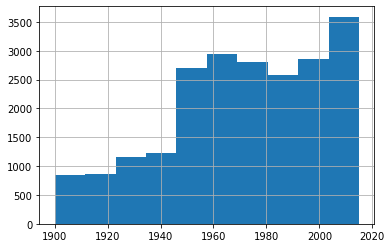

In [20]:
hp.yr_built.hist()

Average living space:

In [21]:
hp.sqft_living.mean()

2080.3218502569803

In [22]:
hp.price.mean()

540296.5735055795

In [23]:
hp.price.max()

7700000.0

In [24]:
hp['yr_old'] = 2020 - hp.yr_built
hp.yr_old

0         65
1         69
2         87
3         55
4         33
5         19
6         25
7         57
8         60
9         17
10        55
11        78
12        93
13        43
14       120
15        41
16        26
17       104
18        99
19        51
20        73
21        52
22        25
23        35
24        35
25        79
26       105
27       111
28        72
29        15
        ... 
21567     77
21568     13
21569     11
21570     11
21571     14
21572     13
21573     10
21574     13
21575      6
21576     12
21577     14
21578     12
21579     14
21580      6
21581     13
21582      6
21583     17
21584     12
21585     12
21586      6
21587     17
21588      6
21589      6
21590     11
21591     12
21592     11
21593      6
21594     11
21595     16
21596     12
Name: yr_old, Length: 21597, dtype: int64

In [25]:
hp.yr_old.mean()

49.000324119090614

In [26]:
hp.yr_old.max()

120

# Missing Values

In [27]:
hp.isnull().sum() #im folgenden namen des datensatzes ändern, damit man die fehlenden werte noch sieht

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     454
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
year_sold           0
month_sold          0
yr_old              0
dtype: int64

In [28]:
missing = pd.DataFrame(hp.isnull().sum(),columns=['Number'])
missing['Percentage'] = round(missing.Number/hp.shape[0]*100,1)
missing[missing.Number!=0]


,Number,Percentage
waterfront,2376,11.0
view,63,0.3
sqft_basement,454,2.1
yr_renovated,3842,17.8


There are **2376 missing values** in *waterfront* and **3842 missing values** for the *renovation year* and **63 missing values** for *houseview*.

+ **waterfront** has 11 percent missing values
+ **view** has 0.3 percent missing values
+ **yr_renovated** has 17.8 percent missing values

In [29]:
hp.waterfront.nunique()

2

In [30]:
hp.waterfront.unique()

array([nan,  0.,  1.])

We can't ignore the waterfront variable since a lake view is considered a positive living aspect and might influence the house price. We cannot ignore the renovation year either, since this might indicate a higher value in old housings as well. 

In [31]:
hp.condition.unique()

array([3, 5, 4, 1, 2])

Inserting the mode for null-values:

In [32]:
hp['waterfront'] = hp['waterfront'].fillna(hp['waterfront'].mode()[0])
hp['view'] = hp['view'].fillna(hp['view'].mode()[0])
hp['yr_renovated'] = hp['yr_renovated'].fillna(hp['yr_renovated'].mode()[0])
hp['sqft_basement'] = hp['sqft_basement'].fillna(hp['sqft_basement'].mode()[0])

In [33]:
hp.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
year_sold        0
month_sold       0
yr_old           0
dtype: int64

# Feature Engineering

## Creating New Features

Adjusting data type of basement size *sqft_basement*:

In [34]:
type(hp.sqft_basement[1])

numpy.float64

Built new variable of the total size of real estate property *sqft_total_property* :

In [35]:
hp['sqft_total_property'] = hp['sqft_living']+ hp['sqft_lot'] + hp['sqft_basement']
hp.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,98178,47.5112,-122.257,1340,5650,2014,10,65,6830.0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1991.0,98125,47.7210,-122.319,1690,7639,2014,12,69,10212.0


## Types of Variables

In [36]:
# find categorical variables
categorical = [var for var in hp.columns if hp[var].dtype=='O']
print('There are {} categorical variables'.format(len(categorical)))

There are 0 categorical variables


In [37]:
# find numerical variables
numerical = [var for var in hp.columns if hp[var].dtype!='O']
print('There are {} numerical variables'.format(len(numerical)))

There are 25 numerical variables


Numerical variables can be binary, continuous or discrete. A priori, it is good practice to know what each variable means, to then be able to differentiate continuous from discrete variables.

In [38]:
# let's visualise the values of the discrete variables

discrete = []
for var in numerical:
    if len(hp[var].unique())<20:
        print(var, ' values: ', hp[var].unique())
        discrete.append(var)
        
print('There are {} discrete variables'.format(len(discrete)))

bedrooms  values:  [ 3  2  4  5  1  6  7  8  9 11 10 33]
floors  values:  [1.  2.  1.5 3.  2.5 3.5]
waterfront  values:  [0. 1.]
view  values:  [0. 3. 4. 2. 1.]
condition  values:  [3 5 4 1 2]
grade  values:  [ 7  6  8 11  9  5 10 12  4  3 13]
year_sold  values:  [2014 2015]
month_sold  values:  [10 12  2  5  6  1  4  3  7  8 11  9]
There are 8 discrete variables


grade, value, condition and waterfront are obviously categorical variables. We need to transform them. 

In [39]:
#transform discrete variable to categorical

hp.grade.astype('category')

0         7
1         7
2         6
3         7
4         8
5        11
6         7
7         7
8         7
9         7
10        8
11        7
12        7
13        7
14        7
15        9
16        7
17        7
18        7
19        7
20        7
21        9
22        8
23        7
24        8
25        6
26        8
27        8
28        7
29        8
         ..
21567     7
21568     7
21569     7
21570     8
21571     8
21572     8
21573     8
21574    11
21575     8
21576     8
21577    10
21578     8
21579     8
21580     9
21581    10
21582     9
21583     9
21584    11
21585     8
21586     6
21587     8
21588     8
21589     9
21590     9
21591     8
21592     8
21593     8
21594     7
21595     8
21596     7
Name: grade, Length: 21597, dtype: category
Categories (11, int64): [3, 4, 5, 6, ..., 10, 11, 12, 13]

In [40]:
hp.waterfront.astype('category')

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
5        0.0
6        0.0
7        0.0
8        0.0
9        0.0
10       0.0
11       0.0
12       0.0
13       0.0
14       0.0
15       0.0
16       0.0
17       0.0
18       0.0
19       0.0
20       0.0
21       0.0
22       0.0
23       0.0
24       0.0
25       0.0
26       0.0
27       0.0
28       0.0
29       0.0
        ... 
21567    0.0
21568    0.0
21569    0.0
21570    0.0
21571    0.0
21572    0.0
21573    0.0
21574    0.0
21575    0.0
21576    0.0
21577    0.0
21578    0.0
21579    0.0
21580    0.0
21581    0.0
21582    0.0
21583    0.0
21584    0.0
21585    0.0
21586    0.0
21587    0.0
21588    0.0
21589    0.0
21590    0.0
21591    0.0
21592    0.0
21593    0.0
21594    0.0
21595    0.0
21596    0.0
Name: waterfront, Length: 21597, dtype: category
Categories (2, float64): [0.0, 1.0]

In [41]:
#check if the encoding has worked
categorical = [var for var in hp.columns if hp[var].dtype=='O']
print('There are {} categorical variables'.format(len(categorical)))

There are 0 categorical variables


In [42]:
# first we make a list of continuous variables (from the numerical ones)
continuous = [var for var in numerical if var not in discrete and var not in ['id', 'price']]
continuous

['date',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'yr_old',
 'sqft_total_property']

The variables are all left skewed and contain outliers.

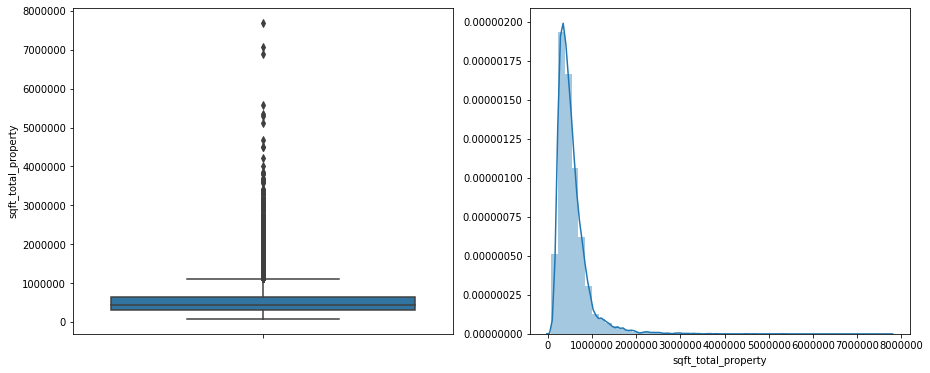

In [43]:
# let's look at the distribution of the target variable

plt.figure(figsize=(15,6))
plt.subplot(1, 2, 1)
fig = sns.boxplot(y=hp['price'])
fig.set_title('')
fig.set_ylabel(var)

plt.subplot(1, 2, 2)
fig = sns.distplot(hp['price'].dropna()) #.hist(bins=20)
fig.set_ylabel('')
fig.set_xlabel(var)

plt.show()

In [44]:
#Let's now check if our categorical variables have a huge number of categories
for var in categorical:
    print(var, ' contains ', len(hp[var].unique()), ' labels')

The price variable is also left skewed and not normally distributed.

## Data Transformation

In [45]:
type(hp.month_sold[1])

numpy.int64

In [46]:
hp.month_sold.astype('category')

0        10
1        12
2         2
3        12
4         2
5         5
6         6
7         1
8         4
9         3
10        4
11        5
12        5
13       10
14        3
15        1
16        7
17        5
18       12
19        4
20        5
21        8
22        7
23        5
24       11
25       11
26        6
27       12
28        6
29        3
         ..
21567     6
21568    12
21569     8
21570    10
21571     3
21572    11
21573     9
21574     5
21575    10
21576     4
21577     3
21578    10
21579    10
21580     8
21581     4
21582    10
21583     9
21584    10
21585     4
21586     6
21587     8
21588     1
21589    10
21590     3
21591     2
21592     5
21593     2
21594     6
21595     1
21596    10
Name: month_sold, Length: 21597, dtype: category
Categories (12, int64): [1, 2, 3, 4, ..., 9, 10, 11, 12]

# Further Exploration

In [47]:
#import plotly.express as px
#fig = px.bar(hp, x='year_sold', y='price')
#fig.show()

In [48]:
#import plotly.express as px

#fig = px.bar(hp, x="year_sold", y="price", color='waterfront')
#fig.show()

In [49]:
#hp.plot.bar(x='month_sold', y='price', rot=0)

In [50]:
#Whats the highest sales price?

hp.price.max()


7700000.0

In [51]:
average_price = hp.price.mean()
average_price.round()

540297.0

In [52]:
#Our client has a budget of 1.5M
hp_subset = hp.query('price > 3500000')
hp_subset.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property
1162,1247600105,2014-10-20,5110000.0,5,5.25,8010,45517,2.0,1.0,4.0,...,0.0,98033,47.6767,-122.211,3430,26788,2014,10,21,55547.0
1313,7558700030,2015-04-13,5300000.0,6,6.00,7390,24829,2.0,1.0,0.0,...,0.0,98040,47.5631,-122.210,4320,24619,2015,4,29,34609.0
1446,8907500070,2015-04-13,5350000.0,5,5.00,8000,23985,2.0,0.0,4.0,...,0.0,98004,47.6232,-122.220,4600,21750,2015,4,11,33265.0
2083,8106100105,2014-11-14,3850000.0,4,4.25,5770,21300,2.0,1.0,4.0,...,0.0,98040,47.5850,-122.222,4620,22748,2014,11,40,27070.0
2624,7738500731,2014-08-15,4500000.0,5,5.50,6640,40014,2.0,1.0,4.0,...,0.0,98155,47.7493,-122.280,3030,23408,2014,8,16,46944.0


In [53]:
hp_subset.shape

(22, 25)

In [54]:
hp_subset.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property
count,2.200000e+01,2.200000e+01,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,...,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,5.393662e+09,4.625455e+06,4.772727,5.090909,7108.181818,25676.954545,1.909091,0.454545,2.454545,3.363636,...,363.590909,98050.181818,47.627314,-122.235591,3813.636364,21256.318182,2014.272727,7.181818,34.045455,34373.318182
std,2.867094e+09,1.234962e+06,0.869144,1.370491,2012.765537,10482.972059,0.332249,0.509647,1.765470,0.581087,...,789.451024,52.241779,0.046943,0.050714,622.242836,9026.858903,0.455842,2.753982,28.112829,11664.307562
min,8.532000e+08,3.570000e+06,3.000000,3.000000,4830.000000,8694.000000,1.000000,0.000000,0.000000,3.000000,...,0.000000,98004.000000,47.557000,-122.370000,2910.000000,8800.000000,2014.000000,1.000000,11.000000,14764.000000
25%,2.758837e+09,3.665000e+06,4.000000,4.250000,5495.000000,19525.000000,2.000000,0.000000,0.250000,3.000000,...,0.000000,98006.500000,47.599375,-122.240750,3430.000000,15856.500000,2014.000000,5.000000,16.250000,26605.750000
50%,5.227251e+09,4.105000e+06,5.000000,5.125000,6845.000000,24407.000000,2.000000,0.000000,3.500000,3.000000,...,0.000000,98039.000000,47.623050,-122.223000,3700.000000,20086.000000,2014.000000,7.500000,20.500000,33606.000000
75%,7.693551e+09,5.252500e+06,5.000000,5.937500,8007.500000,34093.500000,2.000000,1.000000,4.000000,4.000000,...,0.000000,98040.000000,47.640550,-122.213250,4287.500000,24550.500000,2014.750000,9.750000,39.250000,42921.000000
max,9.808701e+09,7.700000e+06,6.000000,8.000000,12050.000000,45517.000000,2.500000,1.000000,4.000000,5.000000,...,2009.000000,98177.000000,47.749300,-122.110000,5070.000000,45302.000000,2015.000000,11.000000,110.000000,55547.000000


In [55]:
hp_subset.sqft_total_property.mean()

34373.318181818184

In [56]:
hp_subset.yr_old.mean()

34.04545454545455

In [57]:
hp_subset.price.mean()

4625454.545454546

In [58]:
#min price for waterfront
hp_3 = hp.groupby('waterfront').min()['price'].reset_index()
hp_3.round()

,waterfront,price
0,0.0,78000.0
1,1.0,285000.0


In [59]:
hp_3 = hp.groupby('waterfront').mean()['price'].reset_index()
hp_3.round()

,waterfront,price
0,0.0,532286.0
1,1.0,1717215.0


In [60]:
hp_3 = hp.groupby('waterfront').max()['price'].reset_index()
hp_3.round()

,waterfront,price
0,0.0,7700000.0
1,1.0,7060000.0


In [61]:
hp_4 = hp.groupby('waterfront').max()['sqft_living'].reset_index()
hp_4.round()

,waterfront,sqft_living
0,0.0,13540
1,1.0,10040


In [62]:
hp_4 = hp.groupby('waterfront').max()['sqft_living'].reset_index()
hp_4.round()

,waterfront,sqft_living
0,0.0,13540
1,1.0,10040


In [63]:
hp_4 = hp.groupby('waterfront').max()['sqft_living'].reset_index()
hp_4.round()

,waterfront,sqft_living
0,0.0,13540
1,1.0,10040


In [64]:
hp_subset['mansion_size'] = hp_subset.sqft_total_property > 10000
hp_subset.head(2)

/Users/student/opt/anaconda3/envs/nf/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property,mansion_size
1162,1247600105,2014-10-20,5110000.0,5,5.25,8010,45517,2.0,1.0,4.0,...,98033,47.6767,-122.211,3430,26788,2014,10,21,55547.0,True
1313,7558700030,2015-04-13,5300000.0,6,6.00,7390,24829,2.0,1.0,0.0,...,98040,47.5631,-122.210,4320,24619,2015,4,29,34609.0,True


In [65]:
#pivot table with query 
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['waterfront'],
                       aggfunc=np.mean)

table

waterfront,0.0,1.0
price,4.734167e+06,4495000.0


In [66]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['grade'],
                       aggfunc=np.mean)

table

grade,10,11,12,13
price,3585000.0,4550000.0,4.420909e+06,5552000.0


In [67]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['bedrooms'],
                       aggfunc=np.mean)

table

bedrooms,3,4,5,6
price,3700000.0,3938000.0,4.648182e+06,5885000.0


In [68]:
 table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['condition'],
                       aggfunc=np.mean)

table

condition,3,4,5
price,4674000.0,4.666667e+06,3650000.0


In [69]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['floors'],
                       aggfunc=np.mean)

table

floors,1.0,1.5,2.0,2.5
price,4235000.0,3650000.0,4.552222e+06,7700000.0


In [70]:
import plotly.express as px

df = hp_subset
fig = px.parallel_categories(df, dimensions=['waterfront', 'bedrooms', 'floors', 'condition', 'grade'],
                color="price", color_continuous_scale=px.colors.sequential.Inferno,
                labels={'price':'price', 'waterfront':'waterfront view', 'bedrooms':'number of bedrooms',  'floors': 'number of floors', 'condition': 'condition of the house','grade': 'grading' })
fig.show()

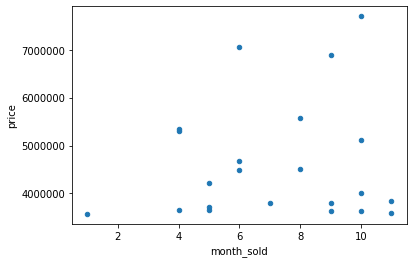

In [75]:
hp_subset.plot(x='month_sold', y='price', kind = 'scatter')

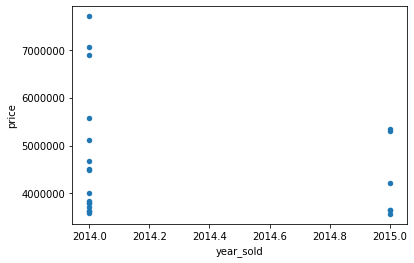

In [76]:
hp_subset.plot(x='year_sold', y='price', kind = 'scatter')

In [77]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['year_sold'],
                       aggfunc=np.mean)

table

year_sold,2014,2015
price,4751875.0,4.288333e+06


In [78]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['year_sold'],
                       aggfunc=np.max)

table

year_sold,2014,2015
price,7700000.0,5350000.0


In [79]:
table = pd.pivot_table(hp_subset.query('mansion_size == True'),
                       values='price',
                       columns=['year_sold'],
                       aggfunc=np.min)

table

year_sold,2014,2015
price,3600000.0,3570000.0


In [80]:
hp.yr_renovated.head()

0       0.0
1    1991.0
2       0.0
3       0.0
4       0.0
Name: yr_renovated, dtype: float64

# Visual Exploration

## Pairplot

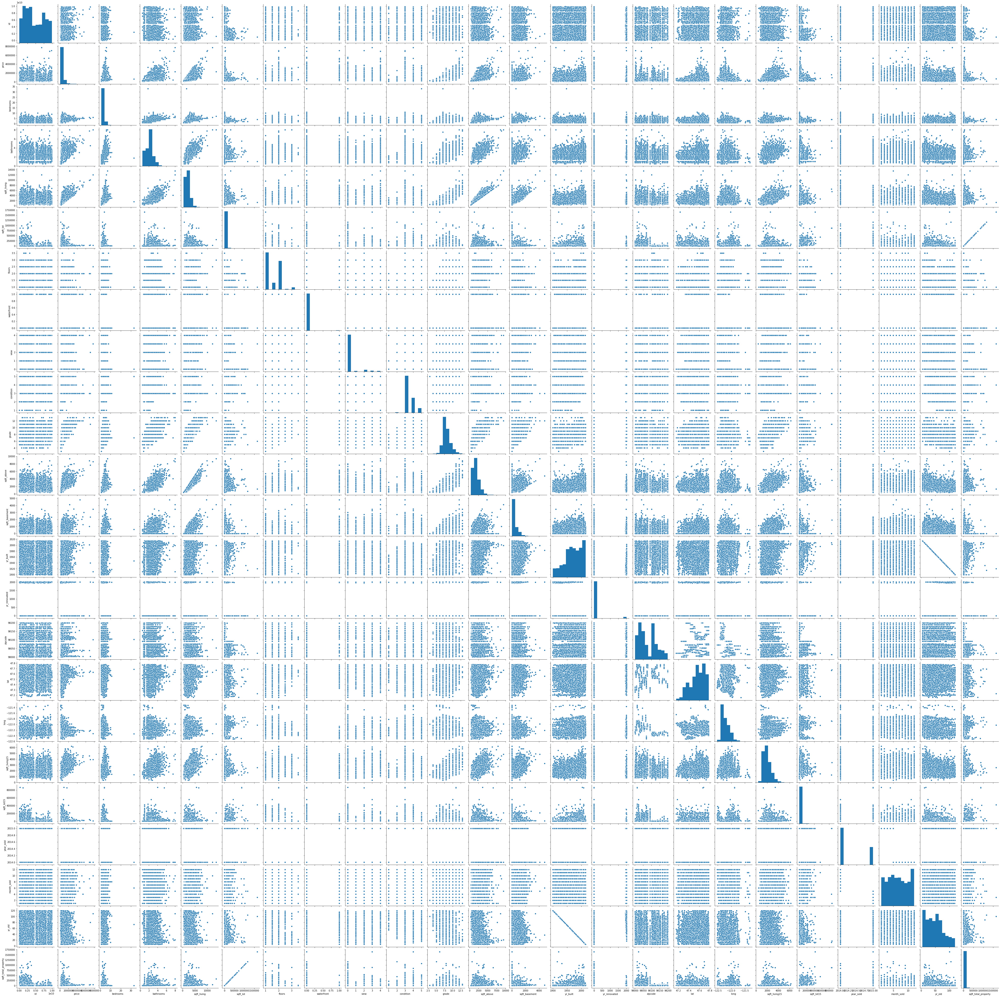

In [82]:
sns.pairplot(hp);
#plt.savefig('figures/pairplot.png')

## Heatmap

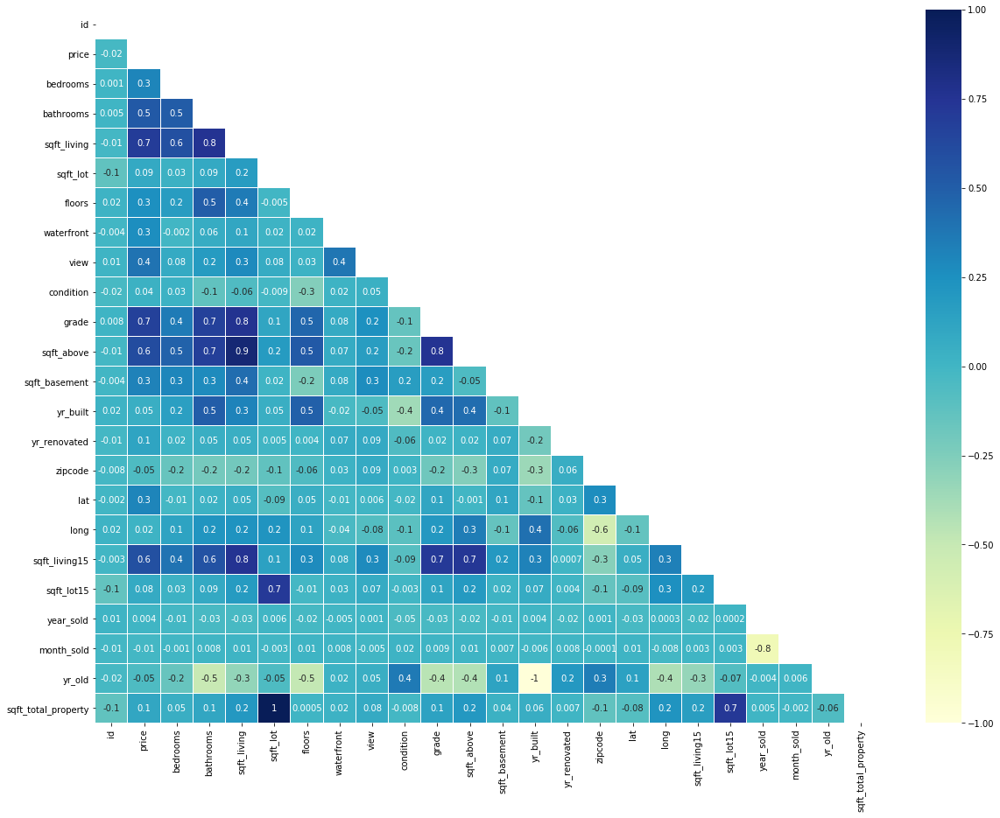

In [84]:
#el(hp['id'])
matrix = np.triu(hp.corr())
plt.subplots(figsize=(20,15))
sns.heatmap(hp.corr(),
           mask=matrix,
           annot = True,
           fmt = '.1g',
           vmin=-1, 
           vmax=1, 
           center= 0,
           cmap= 'YlGnBu',
           linewidth=.1
           );



#plt.savefig('figures/correlogram.png')


## Correlation Matrix

In [85]:
corr_matrix = hp.corr()
corr_matrix['price'].sort_values(ascending=False)

price                  1.000000
sqft_living            0.701917
grade                  0.667951
sqft_above             0.605368
sqft_living15          0.585241
bathrooms              0.525906
view                   0.393497
sqft_basement          0.321108
bedrooms               0.308787
lat                    0.306692
waterfront             0.264306
floors                 0.256804
yr_renovated           0.117855
sqft_total_property    0.108371
sqft_lot               0.089876
sqft_lot15             0.082845
yr_built               0.053953
condition              0.036056
long                   0.022036
year_sold              0.003727
month_sold            -0.009928
id                    -0.016772
zipcode               -0.053402
yr_old                -0.053953
Name: price, dtype: float64

In [87]:
corr_matrix['grade'].sort_values(ascending=False)

grade                  1.000000
sqft_living            0.762779
sqft_above             0.756073
sqft_living15          0.713867
price                  0.667951
bathrooms              0.665838
floors                 0.458794
yr_built               0.447865
bedrooms               0.356563
view                   0.249082
long                   0.200341
sqft_basement          0.165843
sqft_total_property    0.132819
sqft_lot15             0.120981
sqft_lot               0.114731
lat                    0.113575
waterfront             0.082818
yr_renovated           0.015623
month_sold             0.008989
id                     0.008188
year_sold             -0.030635
condition             -0.146896
zipcode               -0.185771
yr_old                -0.447865
Name: grade, dtype: float64

## Histograms

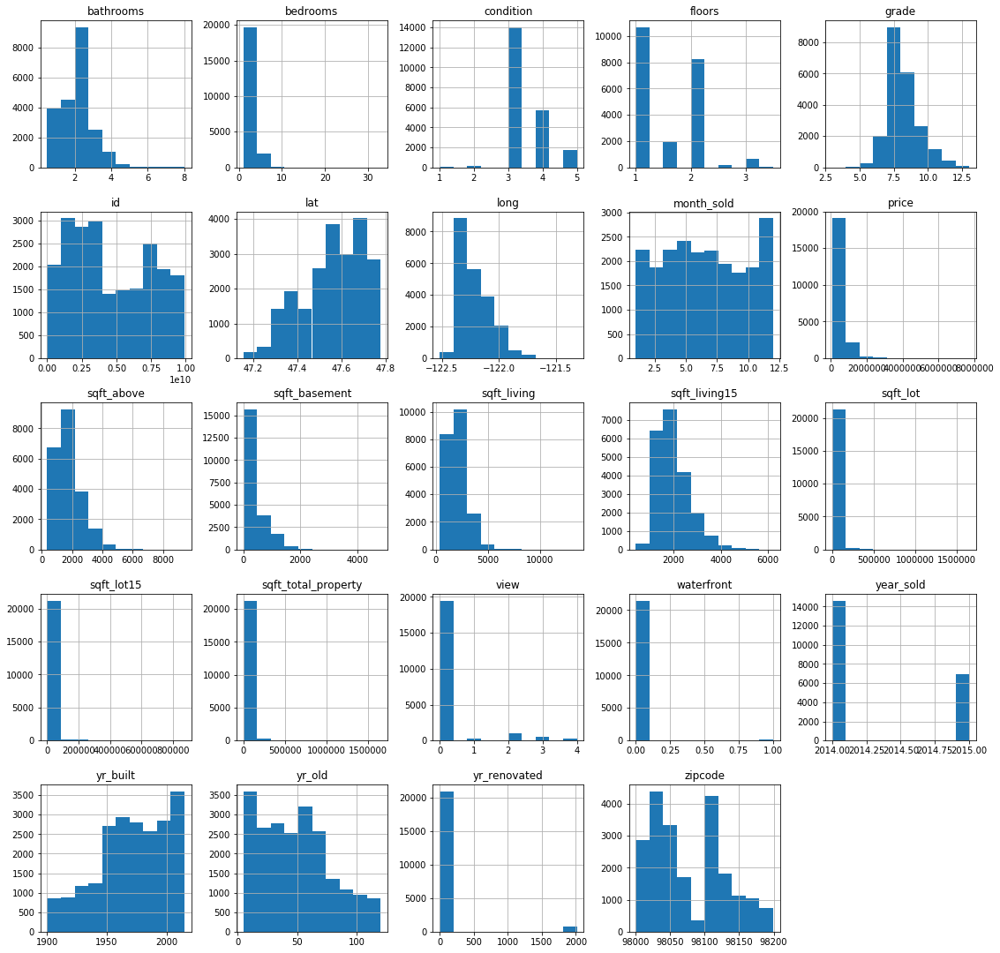

In [88]:
_ = hp.hist(figsize=(19,19))
#plt.savefig('figures/hist_all.png')

The amoung of houses with a waterfront view is very low. The same goes for houses that have been renovated. Consequently, we might use the mode for the missing values. 

## Scatterplots of the highest correlations

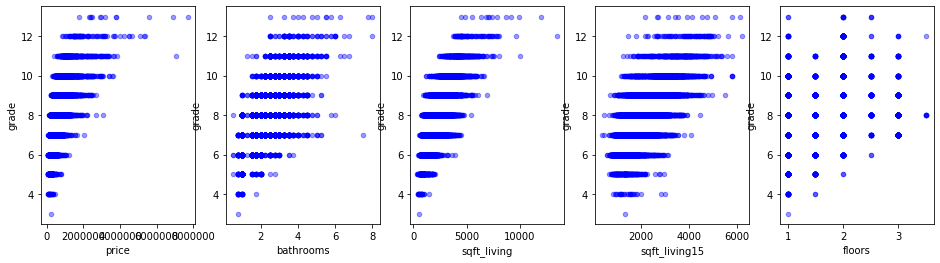

In [89]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(16, 4))

for xcol, ax in zip(
    ['price', 'bathrooms', 'sqft_living', 'sqft_living15', 'floors'], axes):
    hp.plot(kind='scatter', x=xcol, y='grade', ax=ax, alpha=0.4, color='b')

In [90]:
#there are high quality houses that cost as much as some low quality houses. so what defines the price then?

In [91]:
hp[['bathrooms', 'floors']].nunique()

bathrooms    29
floors        6
dtype: int64

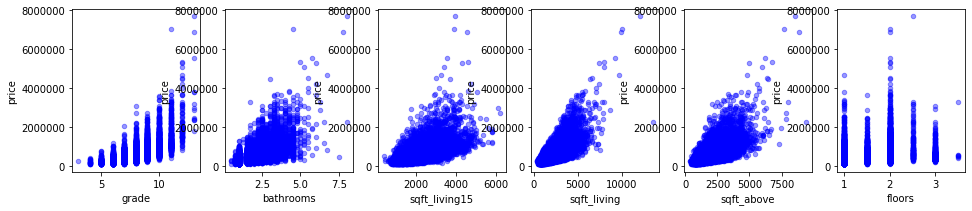

In [92]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(16, 3))

for xcol, ax in zip([
        'grade', 'bathrooms', 'sqft_living15', 'sqft_living', 'sqft_above',
        'floors'], axes):
    hp.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.4, color='b')

In [93]:
hp[['grade', 'floors']].nunique()

grade     11
floors     6
dtype: int64

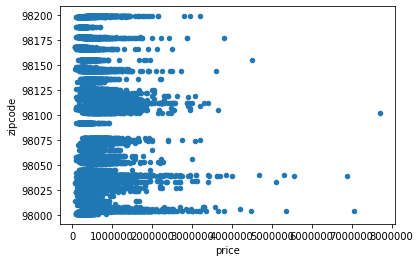

In [94]:
hp.plot(x='price', y='zipcode', kind='scatter')

## Boxplots

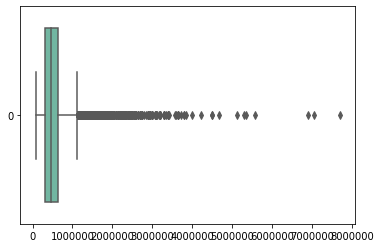

In [99]:
sns.boxplot(data=hp.price, orient='h', palette='Set2');

# Split Data

Split the data set:

In [100]:
X = hp.drop(['price', 'date'], axis = 1)
y = hp['price']

In [101]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=42, test_size=0.3)
X_train.shape, X_test.shape

((15117, 23), (6480, 23))

Linear regression doesn't work on date data. 
Thus, we need to convert it into numerical value:

In [102]:
X_train.head(2)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property
753,8682300890,2,2.50,2380,6600,1.0,0.0,0.0,3,8,...,0.0,98053,47.7170,-122.020,1870,6600,2014,8,10,8980.0
1418,8073000550,4,3.75,3190,17186,2.0,1.0,4.0,3,10,...,0.0,98178,47.5115,-122.246,2290,13496,2015,4,21,20376.0


In [103]:
y_train.head(2)

753      699800.0
1418    1700000.0
Name: price, dtype: float64

# Select Features

Return only the selected features with p_values < 0.05 for the target variable 'price':

In [104]:
X1 = sm.add_constant(X_train)
ols = sm.OLS(y_train, X1)

lr = ols.fit()

selected_features = list(X.columns)
pmax = 1
while (len(selected_features) > 0):
    X_1 = X[selected_features]
    X_1 = sm.add_constant(X_1)
    model = sm.OLS(y, X_1).fit()
    p = pd.Series(model.pvalues.values[1:], index=selected_features)
    pmax = max(p)
    feature_with_p_max = p.idxmax()
    if (pmax > 0.05):
        selected_features.remove(feature_with_p_max)
    else:
        break
print('The selected features for "price" are: ', selected_features)

/Users/student/opt/anaconda3/envs/nf/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



The selected features for "price" are:  ['id', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year_sold', 'yr_old', 'sqft_total_property']


# Linear Model Exploration

## Linear Model of 'price' with selected features

In [105]:
X4 = X_train[[
    'bedrooms', 'bathrooms', 'sqft_lot', 'waterfront', 'view', 'condition',
    'grade', 'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
    'long', 'sqft_living15', 'sqft_lot15', 'sqft_total_property'
]]
X4 = sm.add_constant(X4)
y4 = y_train

X4.head(n=2)

,const,bedrooms,bathrooms,sqft_lot,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sqft_total_property
753,1.0,2,2.50,6600,0.0,0.0,3,8,2380,2010,0.0,98053,47.7170,-122.020,1870,6600,8980.0
1418,1.0,4,3.75,17186,1.0,4.0,3,10,3190,1999,0.0,98178,47.5115,-122.246,2290,13496,20376.0


In [106]:
sm.OLS(y4, X4).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.704
Method:                 Least Squares   F-statistic:                     2253.
Date:                Sun, 14 Jun 2020   Prob (F-statistic):               0.00
Time:                        16:37:18   Log-Likelihood:            -2.0599e+05
No. Observations:               15117   AIC:                         4.120e+05
Df Residuals:                   15100   BIC:                         4.122e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                5.172e+06   3.43e+06      1.508      0.132   -1.55e+06    1.19e+07
bedrooms            -3.699e+04   2342.640    -15.789      0.000   -4.16e+04   -3.24e+04
bathrooms            4.734e+04   3769.934     12.556      0.000    3.99e+04    5.47e+04
sqft_lot              -73.5505      2.506    -29.347      0.000     -78.463     -68.638
waterfront           6.381e+05   2.15e+04     29.679      0.000    5.96e+05     6.8e+05
view                  5.21e+04   2523.110     20.649      0.000    4.72e+04     5.7e+04
condition            2.787e+04   2789.760      9.990      0.000    2.24e+04    3.33e+04
grade                1.013e+05   2563.346     39.531      0.000    9.63e+04    1.06e+05
sqft_above             96.8345      3.753     25.804      0.000      89.479     104.190
yr_built            -2676.8406     83.577    -32.029      0.000   -2840.661   -2513.020
yr_renovated           21.1981      4.758      4.456      0.000      11.872      30.524
zipcode              -555.8593     39.030    -14.242      0.000    -632.362    -479.356
lat                  5.835e+05   1.28e+04     45.616      0.000    5.58e+05    6.09e+05
long                -2.139e+05   1.55e+04    -13.777      0.000   -2.44e+05   -1.84e+05
sqft_living15          27.7104      4.101      6.757      0.000      19.671      35.749
sqft_lot15             -0.4205      0.086     -4.882      0.000      -0.589      -0.252
sqft_total_property    73.6415      2.504     29.415      0.000      68.734      78.549
==============================================================================
Omnibus:                    12294.536   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           971340.957
Skew:                           3.387   Prob(JB):                         0.00
Kurtosis:                      41.681   Cond. No.                     2.18e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.18e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Remove variables with t<10.: 'bathrooms', 'condition', 'yr_renovated', 'sqft_living15', 'sqft_lot15'

# Scale Data

In [107]:
from sklearn.preprocessing import StandardScaler 
# Initialise the Scaler 
scaler = StandardScaler() 
  
# To scale data 
scaler.fit(X_train) 

StandardScaler(copy=True, with_mean=True, with_std=True)

In [108]:
import math 


hp['log_price'] = [math.log(float(p)) for p in hp.price]

hp.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,yr_old,sqft_total_property,log_price
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,98178,47.5112,-122.257,1340,5650,2014,10,65,6830.0,12.309982
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,98125,47.7210,-122.319,1690,7639,2014,12,69,10212.0,13.195614


## Repeat Linear Model with Scaled Data

The R-squared improves after scaling the features:

In [109]:
X = hp.drop(['log_price', 'price', 'date'], axis = 1)
y = hp['log_price']

In [110]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=42, test_size=0.3)
X_train.shape, X_test.shape

((15117, 23), (6480, 23))

In [111]:
X4 = X_train[[
    'bedrooms', 'bathrooms', 'sqft_lot', 'waterfront', 'view', 'condition',
    'grade', 'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
    'long', 'sqft_living15', 'sqft_lot15', 'sqft_total_property'
]]
X4 = sm.add_constant(X4)
y4 = y_train

sm.OLS(y4, X4).fit().summary()

/Users/student/opt/anaconda3/envs/nf/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     3177.
Date:                Sun, 14 Jun 2020   Prob (F-statistic):               0.00
Time:                        16:37:30   Log-Likelihood:                -654.51
No. Observations:               15117   AIC:                             1343.
Df Residuals:                   15100   BIC:                             1473.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 -14.4245      4.327     -3.334      0.001     -22.906      -5.943
bedrooms               -0.0151      0.003     -5.122      0.000      -0.021      -0.009
bathrooms               0.0898      0.005     18.877      0.000       0.080       0.099
sqft_lot            -5.992e-05   3.16e-06    -18.957      0.000   -6.61e-05   -5.37e-05
waterfront              0.4131      0.027     15.234      0.000       0.360       0.466
view                    0.0594      0.003     18.660      0.000       0.053       0.066
condition               0.0601      0.004     17.072      0.000       0.053       0.067
grade                   0.1650      0.003     51.035      0.000       0.159       0.171
sqft_above           8.428e-05   4.73e-06     17.807      0.000     7.5e-05    9.36e-05
yr_built               -0.0032      0.000    -30.785      0.000      -0.003      -0.003
yr_renovated         4.232e-05      6e-06      7.053      0.000    3.06e-05    5.41e-05
zipcode                -0.0006   4.92e-05    -11.792      0.000      -0.001      -0.000
lat                     1.3986      0.016     86.686      0.000       1.367       1.430
long                   -0.1814      0.020     -9.263      0.000      -0.220      -0.143
sqft_living15        9.602e-05   5.17e-06     18.563      0.000    8.59e-05       0.000
sqft_lot15          -3.479e-07   1.09e-07     -3.203      0.001   -5.61e-07   -1.35e-07
sqft_total_property  6.035e-05   3.16e-06     19.113      0.000    5.42e-05    6.65e-05
==============================================================================
Omnibus:                      207.665   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              388.084
Skew:                          -0.014   Prob(JB):                     5.35e-85
Kurtosis:                       3.784   Cond. No.                     2.18e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.18e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [112]:
import statsmodels.formula.api as smf
rs = smf.ols(formula='price ~ grade', data=hp).fit().rsquared
f'{rs:.3}'

'0.446'

scaling and log improves R suqared 

In [113]:
olsm = sm.OLS(y_train, X_train).fit()

In [114]:
predictions = olsm.predict(X_train)

In [115]:
print(predictions)

753      13.136751
1418     14.156891
8178     12.610672
2254     12.373235
4063     12.884101
20396    13.111186
16030    13.815944
21212    12.601704
6933     13.421620
6442     12.362986
9841     13.378314
17178    12.976956
4244     13.374947
15783    12.839827
2438     13.179158
20699    12.982548
2069     13.786786
16415    13.597890
12029    12.544173
5224     13.367645
15290    13.231306
18620    12.241701
13644    12.435307
1078     12.750585
14979    12.366901
2175     13.682385
4125     13.076272
624      12.733149
5083     12.440422
16962    12.635339
           ...    
3005     12.950756
19118    13.818053
189      13.216901
2747     13.722981
18431    12.658678
18942    13.453536
8666     12.700416
6396     14.623667
19769    12.806507
20939    12.830669
17568    13.345679
6420     12.515764
5051     12.967216
5311     13.001693
2433     12.841886
769      13.345302
1685     12.892041
8322     14.156447
16023    13.362753
11363    13.098102
14423    12.555519
4426     13.

# Train-Test Evaluation

In [116]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [117]:
prediction = lm.predict(X_test)

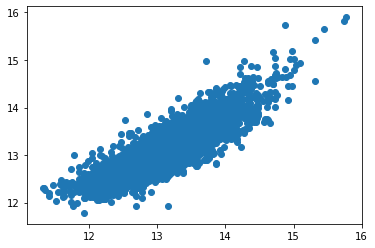

In [118]:
plt.scatter(y_test, prediction)

# Check multicollinearity of 'grade'

*In statistics, multicollinearity (also collinearity) is a phenomenon in which one predictor variable in a multiple regression model can be linearly predicted from the others with a substantial degree of accuracy. In this situation, the coefficient estimates of the multiple regression may change erratically in response to small changes in the model or the data. Multicollinearity does not reduce the predictive power or reliability of the model as a whole, at least within the sample data set; it only affects calculations regarding individual predictors. That is, a multivariate regression model with collinear predictors can indicate how well the entire bundle of predictors predicts the outcome variable, but it may not give valid results about any individual predictor, or about which predictors are redundant with respect to others.*  - Wikipedia article on Multicollinearity

What does the grading system do? How is it related to the evaluated variables?

The **Variance Inflation Factor (VIF)** shows the strength of the correlation between the independent variables. 
It takes a variable and regresses it against every other variable.

In [119]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [120]:
#define data

df = X_train[['bedrooms', 'bathrooms', 'sqft_lot', 'waterfront', 'view', 'condition',
    'grade', 'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
    'long', 'sqft_living15', 'sqft_lot15', 'sqft_total_property']].dropna()

In [121]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X_train.columns
    vif["VIF"] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]

    return(vif)

In [122]:
X = X_train.iloc[:,:-1]
calc_vif(X)

/Users/student/opt/anaconda3/envs/nf/lib/python3.6/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning:

divide by zero encountered in double_scalars



,variables,VIF
0,id,1.030430e+00
1,bedrooms,1.712668e+00
2,bathrooms,3.421890e+00
3,sqft_living,inf
4,sqft_lot,inf
5,floors,2.023834e+00
6,waterfront,1.177368e+00
7,view,1.409082e+00
8,condition,1.249581e+00
9,grade,3.429624e+00


Among the data, the King County grading system is strongly associated with the numbers of floors, bathrooms, squarefeet of living space, the squarfeet of living space in the closest 15 neighbors, as well as with the year the hous was built.

This regression has a R squared below 0.7 . It does not change by removing independent variables. 

On  *https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r* it says:

*BUILDING GRADE*
- Represents the construction quality of improvements. 
- Grades run from grade 1 to 13. Generally defined as:

**1-3** Falls short of minimum building standards. Normally cabin or inferior structure.

**4** Generally older, low quality construction. Does not meet code.

**5** Low construction costs and workmanship. **Small**, simple design.

**6** Lowest grade currently meeting building code. Low quality materials and simple designs.

**7** **Average grade of construction** and design. Commonly seen in plats and **older** sub-divisions.

**8** Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

**9** **Better architectural** design with extra interior and exterior design and quality.

**10** Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a **larger square footage**.

**11** Custom design and higher quality finish work with added amenities of solid woods, **bathroom fixtures and more luxurious options**.

**12** **Custom design and excellent builders**. All materials are of the highest quality and all conveniences are present.

**13** Generally custom designed and built. **Mansion level**. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

# Results and Recommendations
- In the course of 1 year there is a 10.4% price decrease in luxury house prices. Therefore, it is recommended to by a luxurious mansion sized house in 2015.
- When buying a property of more than 10,000 sqft space
a. buy at the waterfront
b. with 1.5 of floors
c. graded with a 10 or 11

# Future Work
- improve  and apply the linear model by reducing features and evaluate train-test split
- compare price segments
- search for underrated objects
- explore multicollinearity